# Seoul Restaurants Clustering

## Part 4 : Clustering neighbourhood

In this part, we will use the data we processed in the second part to cluster neighbourhoods.

In [494]:
# Import libraries
import pandas as pd # library for data analsysis
import numpy as np # library to handle data in a vectorized manner
import folium # map rendering library
from folium.plugins import FastMarkerCluster, MarkerCluster
from sklearn.cluster import KMeans # K-Means clustering algorithm
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering # Agglomerative clustering algorithm
import scipy.cluster.hierarchy as shc 
import json
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

In [495]:
# Load data from the file we saved in the previous part into a data frame
df_venues = pd.read_pickle('restaurants_list_prepared.pkl')

In [496]:
df_venues.head()

,Id,Name,Category,Address,Latitude,Longitude,District,Neighbourhood Legal,Neighbourhood Admin
0,5b83cf2cc0cacb002c0bd030,인기명,Seafood Restaurant,None,37.538245,126.947835,마포구,도화동,도화동
1,5dc62e31e42b4c000735f531,"Nal,See (날,See)",Sandwich Place,증산로21길 16,37.596088,126.913109,은평구,신사동,신사1동
2,5d7e19bed13342000856212d,핵도그,Hot Dog Joint,보문로 99 영광빌딩 1층,37.583890,127.019922,성북구,보문동5가,보문동
3,4ddca1eab0fba481fc8678e4,한우목장,Steakhouse,None,37.606292,127.061433,성북구,석관동,석관동
4,4eaa7d8d49015844898445d0,풍년 닭도리탕,Korean Restaurant,중구 세종대로11길 30,37.563080,126.977783,중구,북창동,소공동


In [ ]:
# Two neighbourhoods have the same name in our data set. We should distinguish them.
df_venues['Neighbourhood Legal'].loc[(df_venues['District']=='강남구') & (df_venues['Neighbourhood Legal'] == '신사동')] = '신사동(강남구)'
df_venues['Neighbourhood Legal'].loc[(df_venues['District']=='은평구') & (df_venues['Neighbourhood Legal'] == '신사동')] = '신사동(은평구)'

In [498]:
df_venues

,Id,Name,Category,Address,Latitude,Longitude,District,Neighbourhood Legal,Neighbourhood Admin
0,5b83cf2cc0cacb002c0bd030,인기명,Seafood Restaurant,None,37.538245,126.947835,마포구,도화동,도화동
1,5dc62e31e42b4c000735f531,"Nal,See (날,See)",Sandwich Place,증산로21길 16,37.596088,126.913109,은평구,신사동(은평구),신사1동
2,5d7e19bed13342000856212d,핵도그,Hot Dog Joint,보문로 99 영광빌딩 1층,37.583890,127.019922,성북구,보문동5가,보문동
3,4ddca1eab0fba481fc8678e4,한우목장,Steakhouse,None,37.606292,127.061433,성북구,석관동,석관동
4,4eaa7d8d49015844898445d0,풍년 닭도리탕,Korean Restaurant,중구 세종대로11길 30,37.563080,126.977783,중구,북창동,소공동
...,...,...,...,...,...,...,...,...,...
15571,5059bc2fe4b0616dc6acf84d,the JK kitchenbox,Italian Restaurant,금천구 가산동 371-50 에이스하이엔드 타워 3차 111호,37.529682,126.892634,영등포구,양평동3가,양평1동
15572,5ac2d7703fcee8366a8935fa,김가네 (상도점),Bunsik Restaurant,"상도로30길 40, 120호",37.504112,126.943580,동작구,상도동,상도2동
15573,4c10ca80ce57c928fe5682d2,오가와,Sushi Restaurant,종로구 새문안로5길 19,37.571841,126.974593,종로구,당주동,사직동
15574,4d89cfb876e1236ac0d00b43,부뚜막청국장,Korean Restaurant,None,37.468699,126.902318,금천구,독산동,독산4동


In [422]:
# Let's calculate how many restaurants we retrieved for each neighbourhood
df_venue_neigh_count = df_venues.groupby('Neighbourhood Legal').count()[['Id']].sort_values(by=['Id'], ascending=False).reset_index()
df_venue_neigh_count.describe()

,Id
count,455.000000
mean,34.068132
std,30.496583
min,1.000000
25%,10.000000
50%,24.000000
75%,55.000000
max,222.000000


On a total of 455 neighbourhoods, we retrieved an average of 34 restaurants per neighbourhood. The minimum is 1 and the maximum is 222.
A neighbourhood with only a few restaurants can hardly be representative of any pattern. Let's remove those from the data frame.

In [423]:
# Let's remove restaurants located in neighbourhoods in which we retrieved less than 10 restaurants
neigh_count = df_venues['Neighbourhood Legal'].value_counts()
threshold  = [i not in set(neigh_count[neigh_count<10].index) for i in df_venues['Neighbourhood Legal']]
df_venues = df_venues[threshold].reset_index(drop = True)

In [424]:
df_venues.shape

(14996, 9)

In [425]:
# Let's calculate how many restaurants we retrieved for each neighbourhood
df_venue_neigh_count = df_venues.groupby('Neighbourhood Legal').count()[['Id']].sort_values(by=['Id'], ascending=False).reset_index()
df_venue_neigh_count.describe()

,Id
count,346.000000
mean,43.341040
std,29.360812
min,10.000000
25%,19.000000
50%,37.000000
75%,61.000000
max,222.000000


In [426]:
# Let's plot the neigbourhoods on a map of Seoul

# Create map of Seoul using the central latitude and longitude of the capital
map_seoul = folium.Map(location=[37.5665, 126.9780], zoom_start=12)

# Load our GeoJSON file that we found on internet
#geo_path = 'HangJeongDong_ver20190908.geojson'
geo_path = 'seoul_dong_geo.json'
geo_str = json.load(open(geo_path, encoding='utf-8'))

# Add a Choropleth layer based on the number of restaurants retrieved for each neighborhood
folium.Choropleth(
    geo_data = geo_str,
    data=df_venue_neigh_count,
    columns=['Neighbourhood Legal', 'Id'],
    nan_fill_opacity=0,    
    key_on='feature.properties.EMD_KOR_NM',    
    fill_color = 'YlOrRd',
    fill_opacity=0.5, 
    line_opacity=0.3, 
    ).add_to(map_seoul)

map_seoul

Lighter neighbourhoods contain fewer restaurants.

Prior to clustering our restaurants, we need to convert the 'category' field into a numerical field. Converting a categorical feature to a numerical feature can be done using dummy variables (0 or 1) via a process called one-hot encoding

In [427]:
# Make a data frame with a one-hot encoding of categories (one column for each category)
df_venues_onehot = pd.get_dummies(df_venues[['Category']], prefix="", prefix_sep="")

# Add the neighborhood column back to the data frame
df_venues_onehot['Neighbourhood Legal'] = df_venues['Neighbourhood Legal'] 

# Move the neighborhood column to the first column
fixed_columns = [df_venues_onehot.columns[-1]] + list(df_venues_onehot.columns[:-1])
df_venues_onehot = df_venues_onehot[fixed_columns]

In [428]:
df_venues_onehot

,Neighbourhood Legal,American Restaurant,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beer Bar,Bistro,Bookstore,...,Tapas Restaurant,Tea Room,Thai Restaurant,Theme Restaurant,Turkish Restaurant,Udon Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wings Joint
0,도화동,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,신사동,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,석관동,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,양평동4가,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,영등포동2가,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14991,양평동3가,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14992,상도동,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14993,당주동,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14994,독산동,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [429]:
# Now we can group our restaurants by neighbourhood and see what is the ratio of cuisine type for each neighbourhood
df_venues_grouped = df_venues_onehot.groupby('Neighbourhood Legal').mean().reset_index()
df_venues_grouped

,Neighbourhood Legal,American Restaurant,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beer Bar,Bistro,Bookstore,...,Tapas Restaurant,Tea Room,Thai Restaurant,Theme Restaurant,Turkish Restaurant,Udon Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wings Joint
0,가락동,0.0,0.033333,0.083333,0.000000,0.050000,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.066667,0.0,0.0
1,가산동,0.0,0.047059,0.011765,0.000000,0.011765,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.011765,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
2,가양동,0.0,0.000000,0.142857,0.000000,0.000000,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
3,가회동,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,...,0.0,0.052632,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
4,갈월동,0.0,0.000000,0.038462,0.000000,0.038462,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.038462,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,효창동,0.0,0.000000,0.000000,0.000000,0.052632,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
342,후암동,0.0,0.060000,0.100000,0.000000,0.040000,0.0,0.0,0.020000,0.0,...,0.0,0.020000,0.020000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
343,휘경동,0.0,0.000000,0.054054,0.013514,0.054054,0.0,0.0,0.000000,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.013514,0.027027,0.0,0.0
344,흑석동,0.0,0.000000,0.058824,0.000000,0.078431,0.0,0.0,0.009804,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.029412,0.0,0.0


In [430]:
# Let's see what are the most common restaurants in each neighbourhood

# We first define a function that returns the x most common categories in a row
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:num_top_venues]

# We will filter to the top 8 categories
num_top_venues = 8
indicators = ['st', 'nd', 'rd']

# Create columns to our data frame
columns = ['Neighbourhood Legal']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} most common'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th most common'.format(ind+1))

# Populate the data frame
df_venues_sorted = pd.DataFrame(columns=columns)
df_venues_sorted['Neighbourhood Legal'] = df_venues_grouped['Neighbourhood Legal']

for ind in np.arange(df_venues_grouped.shape[0]):
    df_venues_sorted.iloc[ind, 1:] = return_most_common_venues(df_venues_grouped.iloc[ind, :], num_top_venues)

df_venues_sorted.head()

,Neighbourhood Legal,1st most common,2nd most common,3rd most common,4th most common,5th most common,6th most common,7th most common,8th most common
0,가락동,Korean Restaurant,Seafood Restaurant,BBQ Joint,Vietnamese Restaurant,Café,Bakery,Coffee Shop,Asian Restaurant
1,가산동,Korean Restaurant,Coffee Shop,Café,Chinese Restaurant,Fast Food Restaurant,Asian Restaurant,Italian Restaurant,Noodle House
2,가양동,Korean Restaurant,BBQ Joint,Café,Gukbap Restaurant,Italian Restaurant,Japanese Restaurant,Fried Chicken Joint,Snack Place
3,가회동,Café,Korean Restaurant,Spanish Restaurant,Tea Room,Coffee Shop,Samgyetang Restaurant,Pizza Place,Deli / Bodega
4,갈월동,Korean Restaurant,Coffee Shop,Café,Ice Cream Shop,BBQ Joint,Snack Place,Sandwich Place,Food Truck


Now we can try find clusters of neighbourhoods (neighbourhoods which are similar in the type of restaurants they host)

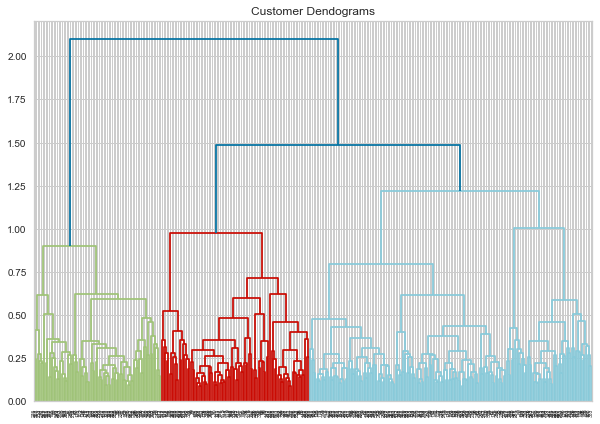

In [431]:
# 1. Hierarchical clustering

# We use a Hierarchical Clustering algorithm from scikit-learn, called AgglomerativeClustering
df_venues_clustering = df_venues_grouped.drop('Neighbourhood Legal', 1) 
plt.figure(figsize=(10, 7))
plt.title("Customer Dendograms")
dend = shc.dendrogram(shc.linkage(df_venues_clustering, method='ward'))

In [433]:
cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
cluster.fit_predict(df_venues_clustering)
print(cluster.labels_)
#df_venues_sorted.drop(['Cluster'], axis=1, inplace = True)
df_venues_sorted.insert(0, 'Cluster', cluster.labels_)
df_venues_sorted

[2 3 1 0 3 2 2 3 3 2 3 1 3 3 0 1 1 1 1 2 0 1 3 3 1 3 2 3 3 1 3 3 3 3 2 1 0
 2 0 3 1 1 3 1 2 1 0 2 3 3 0 0 3 1 2 3 0 2 2 1 1 3 3 2 2 2 1 2 1 2 2 1 3 0
 3 2 3 3 2 2 1 0 2 1 3 3 2 3 2 1 3 2 1 2 3 0 3 2 3 3 0 1 2 0 3 1 3 3 3 3 1
 2 0 3 3 1 1 2 2 2 0 0 1 0 3 3 3 0 2 0 0 3 3 0 2 1 3 2 3 3 2 0 2 2 3 2 3 2
 3 3 2 1 3 3 3 3 3 0 0 2 0 3 2 1 0 1 3 0 1 2 3 3 0 1 1 2 3 3 3 2 3 2 2 3 0
 1 1 1 0 2 3 2 1 3 1 2 1 1 3 3 3 3 1 1 0 2 3 0 2 3 3 1 2 1 1 2 2 2 1 1 3 1
 3 0 1 3 2 1 3 1 2 0 2 0 3 0 3 1 3 2 2 3 3 3 2 0 3 2 3 1 2 3 2 0 3 0 1 1 3
 3 3 2 3 3 1 2 1 3 1 3 3 3 1 1 0 2 1 1 2 3 3 1 1 2 1 1 0 1 3 2 3 2 2 3 2 3
 3 0 3 3 1 2 1 1 1 3 3 0 2 3 2 0 2 3 2 3 3 3 2 2 1 2 2 3 2 0 0 1 1 2 2 2 2
 0 1 0 0 2 3 2 0 3 0 3 3 0]


,Cluster,Neighbourhood Legal,1st most common,2nd most common,3rd most common,4th most common,5th most common,6th most common,7th most common,8th most common
0,2,가락동,Korean Restaurant,Seafood Restaurant,BBQ Joint,Vietnamese Restaurant,Café,Bakery,Coffee Shop,Asian Restaurant
1,3,가산동,Korean Restaurant,Coffee Shop,Café,Chinese Restaurant,Fast Food Restaurant,Asian Restaurant,Italian Restaurant,Noodle House
2,1,가양동,Korean Restaurant,BBQ Joint,Café,Gukbap Restaurant,Italian Restaurant,Japanese Restaurant,Fried Chicken Joint,Snack Place
3,0,가회동,Café,Korean Restaurant,Spanish Restaurant,Tea Room,Coffee Shop,Samgyetang Restaurant,Pizza Place,Deli / Bodega
4,3,갈월동,Korean Restaurant,Coffee Shop,Café,Ice Cream Shop,BBQ Joint,Snack Place,Sandwich Place,Food Truck
...,...,...,...,...,...,...,...,...,...,...
341,3,효창동,Korean Restaurant,Coffee Shop,Café,Bakery,Noodle House,Breakfast Spot,Wings Joint,Food Stand
342,0,후암동,Café,Coffee Shop,BBQ Joint,Korean Restaurant,Asian Restaurant,Japanese Restaurant,Burger Joint,Bakery
343,3,휘경동,Café,Korean Restaurant,Coffee Shop,Fried Chicken Joint,BBQ Joint,Bakery,Chinese Restaurant,Restaurant
344,3,흑석동,Korean Restaurant,Café,Restaurant,Bakery,BBQ Joint,Coffee Shop,Italian Restaurant,Fried Chicken Joint


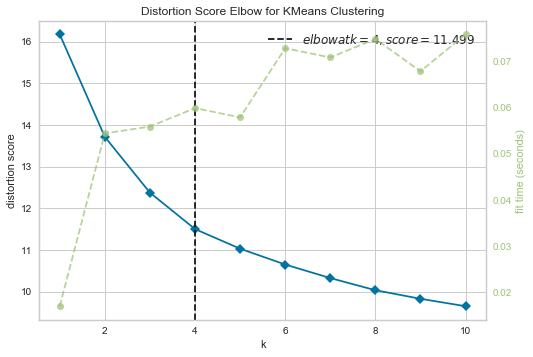

In [445]:
# 2. K-means Clustering 

# We use a K-means Clustering algorithm from scikit-learn
# And an 'elbow' finding method from yellowbrick to find the optimal number of clusters
df_venues_clustering = df_venues_grouped.drop('Neighbourhood Legal', 1) 
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,11))

visualizer.fit(df_venues_clustering) # Fit the data to the visualizer
visualizer.show()

In [446]:
# Based on the graph, the optimal value of k is :
opt_k = 4

# Fit the model using the optimal value of k
model = KMeans(n_clusters=opt_k)
model.fit(df_venues_clustering)
labels = model.labels_

# Add the clustering labels to our data frame
df_venues_sorted.drop(['Cluster'], axis=1, inplace = True)
df_venues_sorted.insert(0, 'Cluster', labels)

(346, 10)

In [452]:
# Create map of Seoul using the central latitude and longitude of the capital
map_seoul = folium.Map(location=[37.5665, 126.9780], zoom_start=12)

# Load our GeoJSON file that we found on internet
geo_path = 'seoul_dong_geo.json'
geo_str = json.load(open(geo_path, encoding='utf-8'))

# Add a Choropleth layer based on the number of restaurants retrieved for each neighbourhood
folium.Choropleth(
    geo_data = geo_str,
    data=df_venues_sorted,
    columns=['Neighbourhood Legal', 'Cluster'],
    nan_fill_opacity=0,
    key_on='feature.properties.EMD_KOR_NM',    
    fill_color = 'Dark2',
    fill_opacity=0.5, 
    line_opacity=0.4, 
    ).add_to(map_seoul)

map_seoul

In [493]:
# Let's examine each cluster to determine the discriminating venue categories that distinguish each cluster.
# Cluster 0
print(df_venues_sorted.loc[df_venues_sorted['Cluster'] == 0, df_venues_sorted.columns[[1] + list(range(0, df_venues_sorted.shape[1]))]].shape)
df_venues_sorted.loc[df_venues_sorted['Cluster'] == 0, df_venues_sorted.columns[[1] + list(range(0, df_venues_sorted.shape[1]))]].tail(20)

(73, 11)


,Neighbourhood Legal,Cluster,Neighbourhood Legal,1st most common,2nd most common,3rd most common,4th most common,5th most common,6th most common,7th most common,8th most common
274,종로2가,0,종로2가,Coffee Shop,Café,Korean Restaurant,Fast Food Restaurant,Pizza Place,BBQ Joint,Donut Shop,Dessert Shop
275,종로3가,0,종로3가,Coffee Shop,Korean Restaurant,Restaurant,Hot Dog Joint,Sandwich Place,Café,Donut Shop,Fast Food Restaurant
283,중학동,0,중학동,Coffee Shop,Korean Restaurant,Food Court,Italian Restaurant,Japanese Restaurant,Sandwich Place,Café,Steakhouse
286,진관동,0,진관동,Bakery,Coffee Shop,Café,Korean Restaurant,Noodle House,Restaurant,Tea Room,Bistro
291,창천동,0,창천동,Korean Restaurant,Coffee Shop,BBQ Joint,Japanese Restaurant,Chinese Restaurant,Bakery,Café,Dessert Shop
297,청진동,0,청진동,Coffee Shop,Café,Italian Restaurant,Mexican Restaurant,Korean Restaurant,Gukbap Restaurant,Bagel Shop,Pizza Place
301,충무로1가,0,충무로1가,Chinese Restaurant,Coffee Shop,Korean Restaurant,BBQ Joint,Japanese Restaurant,Samgyetang Restaurant,Burger Joint,Fried Chicken Joint
307,태평로1가,0,태평로1가,Coffee Shop,Café,Steakhouse,Korean Restaurant,Chinese Restaurant,Pub,Bistro,Noodle House
308,태평로2가,0,태평로2가,Korean Restaurant,Coffee Shop,Italian Restaurant,Chinese Restaurant,BBQ Joint,Noodle House,Fast Food Restaurant,Food Court
312,평동,0,평동,Coffee Shop,Bakery,Sushi Restaurant,Middle Eastern Restaurant,Bunsik Restaurant,Chinese Restaurant,Fried Chicken Joint,Dessert Shop


In [454]:
# Let's examine each cluster to determine the discriminating venue categories that distinguish each cluster.
# Cluster 1
print(df_venues_sorted.loc[df_venues_sorted['Cluster'] == 1, df_venues_sorted.columns[[1] + list(range(0, df_venues_sorted.shape[1]))]].shape)
df_venues_sorted.loc[df_venues_sorted['Cluster'] == 1, df_venues_sorted.columns[[1] + list(range(0, df_venues_sorted.shape[1]))]].head(20)

(73, 11)


,Neighbourhood Legal,Cluster,Neighbourhood Legal,1st most common,2nd most common,3rd most common,4th most common,5th most common,6th most common,7th most common,8th most common
3,가회동,1,가회동,Café,Korean Restaurant,Spanish Restaurant,Tea Room,Coffee Shop,Samgyetang Restaurant,Pizza Place,Deli / Bodega
8,개포동,1,개포동,Café,Korean Restaurant,BBQ Joint,Bakery,Fried Chicken Joint,Asian Restaurant,Food Truck,Coffee Shop
14,공릉동,1,공릉동,Café,Sandwich Place,Korean Restaurant,Bakery,Fried Chicken Joint,Bunsik Restaurant,Noodle House,Coffee Shop
23,구산동,1,구산동,Korean Restaurant,Café,Bakery,Restaurant,Asian Restaurant,Noodle House,Japanese Restaurant,BBQ Joint
27,궁동,1,궁동,Korean Restaurant,Café,Restaurant,BBQ Joint,Bakery,Dessert Shop,Coffee Shop,Chinese Restaurant
31,금호동4가,1,금호동4가,Korean Restaurant,Café,Bakery,Coffee Shop,Restaurant,Seafood Restaurant,Fried Chicken Joint,Dumpling Restaurant
33,길음동,1,길음동,Café,Korean Restaurant,Fried Chicken Joint,Japanese Restaurant,Bunsik Restaurant,Chinese Restaurant,Coffee Shop,Restaurant
36,남대문로4가,1,남대문로4가,Coffee Shop,Café,Korean Restaurant,Sandwich Place,Noodle House,Food Truck,Buffet,Wings Joint
38,남산동2가,1,남산동2가,Café,Coffee Shop,Korean Restaurant,Italian Restaurant,BBQ Joint,Fried Chicken Joint,Wings Joint,Food Stand
50,누상동,1,누상동,Café,Italian Restaurant,Korean Restaurant,Wings Joint,Bistro,Japanese Restaurant,Soba Restaurant,Burger Joint


In [471]:
# Cluster 2
print(df_venues_sorted.loc[df_venues_sorted['Cluster'] == 2, df_venues_sorted.columns[[1] + list(range(0, df_venues_sorted.shape[1]))]].shape)
df_venues_sorted.loc[df_venues_sorted['Cluster'] == 2, df_venues_sorted.columns[[1] + list(range(0, df_venues_sorted.shape[1]))]].tail(20)

(62, 11)


,Neighbourhood Legal,Cluster,Neighbourhood Legal,1st most common,2nd most common,3rd most common,4th most common,5th most common,6th most common,7th most common,8th most common
249,응암동,2,응암동,Korean Restaurant,Café,Restaurant,Asian Restaurant,Bakery,Bossam/Jokbal Restaurant,BBQ Joint,Bunsik Restaurant
256,인사동,2,인사동,Korean Restaurant,Coffee Shop,Noodle House,Restaurant,Dessert Shop,Sandwich Place,Fried Chicken Joint,Café
257,인의동,2,인의동,Korean Restaurant,Restaurant,Coffee Shop,Japanese Restaurant,Café,Food Court,Dessert Shop,Dim Sum Restaurant
266,장충동1가,2,장충동1가,Korean Restaurant,Bossam/Jokbal Restaurant,Asian Restaurant,Bakery,Noodle House,Japanese Restaurant,Coffee Shop,Chinese Restaurant
273,제기동,2,제기동,Korean Restaurant,Chinese Restaurant,Fried Chicken Joint,Coffee Shop,Noodle House,Japanese Restaurant,Seafood Restaurant,Bakery
276,종로4가,2,종로4가,Korean Restaurant,Coffee Shop,Fried Chicken Joint,Wings Joint,Food Stand,Dim Sum Restaurant,Diner,Dive Bar
277,종로5가,2,종로5가,Korean Restaurant,Seafood Restaurant,Coffee Shop,Samgyetang Restaurant,Fried Chicken Joint,Japanese Restaurant,Sandwich Place,Sushi Restaurant
281,중동,2,중동,Korean Restaurant,Café,Wings Joint,BBQ Joint,Bakery,Coffee Shop,Noodle House,Fried Chicken Joint
282,중림동,2,중림동,Korean Restaurant,Café,BBQ Joint,Coffee Shop,Restaurant,Seafood Restaurant,Japanese Restaurant,Bakery
284,중화동,2,중화동,Korean Restaurant,Restaurant,Café,BBQ Joint,Chinese Restaurant,Fried Chicken Joint,Noodle House,Gukbap Restaurant


In [491]:
# Cluster 3
print(df_venues_sorted.loc[df_venues_sorted['Cluster'] == 3, df_venues_sorted.columns[[1] + list(range(0, df_venues_sorted.shape[1]))]].shape)
df_venues_sorted.loc[df_venues_sorted['Cluster'] == 3, df_venues_sorted.columns[[1] + list(range(0, df_venues_sorted.shape[1]))]].head(20)

(138, 11)


,Neighbourhood Legal,Cluster,Neighbourhood Legal,1st most common,2nd most common,3rd most common,4th most common,5th most common,6th most common,7th most common,8th most common
0,가락동,3,가락동,Korean Restaurant,Seafood Restaurant,BBQ Joint,Vietnamese Restaurant,Café,Bakery,Coffee Shop,Asian Restaurant
2,가양동,3,가양동,Korean Restaurant,BBQ Joint,Café,Gukbap Restaurant,Italian Restaurant,Japanese Restaurant,Fried Chicken Joint,Snack Place
4,갈월동,3,갈월동,Korean Restaurant,Coffee Shop,Café,Ice Cream Shop,BBQ Joint,Snack Place,Sandwich Place,Food Truck
5,갈현동,3,갈현동,Korean Restaurant,Café,BBQ Joint,Coffee Shop,Japanese Restaurant,Snack Place,Asian Restaurant,Chinese Restaurant
6,강일동,3,강일동,Fried Chicken Joint,Snack Place,BBQ Joint,Restaurant,Chinese Restaurant,Korean Restaurant,Bunsik Restaurant,Sushi Restaurant
7,개봉동,3,개봉동,Korean Restaurant,Coffee Shop,BBQ Joint,Café,Seafood Restaurant,Fried Chicken Joint,Bakery,Food Truck
9,거여동,3,거여동,Korean Restaurant,BBQ Joint,Restaurant,Café,Fried Chicken Joint,Coffee Shop,Pizza Place,Bakery
12,고척동,3,고척동,Korean Restaurant,Café,Coffee Shop,Bakery,BBQ Joint,Seafood Restaurant,Asian Restaurant,Restaurant
13,공덕동,3,공덕동,Korean Restaurant,Café,Seafood Restaurant,Japanese Restaurant,Coffee Shop,Bakery,BBQ Joint,Noodle House
16,관철동,3,관철동,Korean Restaurant,Japanese Restaurant,Coffee Shop,Sushi Restaurant,Vietnamese Restaurant,Seafood Restaurant,BBQ Joint,Chinese Restaurant


In [457]:
# Cluster 4
print(df_venues_sorted.loc[df_venues_sorted['Cluster'] == 4, df_venues_sorted.columns[[1] + list(range(0, df_venues_sorted.shape[1]))]].shape)
df_venues_sorted.loc[df_venues_sorted['Cluster'] == 4, df_venues_sorted.columns[[1] + list(range(0, df_venues_sorted.shape[1]))]].tail(20)

(0, 11)


,Neighbourhood Legal,Cluster,Neighbourhood Legal,1st most common,2nd most common,3rd most common,4th most common,5th most common,6th most common,7th most common,8th most common


In [460]:
df_venues_grouped[df_venues_grouped['Neighbourhood Legal'] == '망원동'].iloc[0,1:].sort_values(ascending=False).head(10)

Café                    0.208955
Korean Restaurant        0.19403
Coffee Shop             0.119403
Noodle House           0.0597015
BBQ Joint              0.0597015
Bakery                 0.0597015
Italian Restaurant     0.0447761
Japanese Restaurant    0.0298507
Restaurant             0.0298507
Ice Cream Shop         0.0298507
Name: 90, dtype: object

In [492]:
df_venues_sorted[df_venues_sorted['Neighbourhood Legal'] == '여의도동']

,Cluster,Neighbourhood Legal,1st most common,2nd most common,3rd most common,4th most common,5th most common,6th most common,7th most common,8th most common
204,0,여의도동,Korean Restaurant,Coffee Shop,Café,Japanese Restaurant,Italian Restaurant,Bakery,BBQ Joint,Noodle House
